In [1]:
import os
import numpy as np
import pandas as pd
from pandas import read_csv, DataFrame
from matplotlib import pyplot as plt
import datetime as dt
from dataset.electricity_dataset import electricity_pre
from datetime import datetime
import warnings
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data.dataloader import DataLoader
from torch.utils.data.dataset import Dataset
from torch.utils.data.dataloader import DataLoader
from torch.utils.data.sampler import Sampler, SubsetRandomSampler
import random

In [2]:
warnings.filterwarnings('ignore')
now = datetime.now()
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

In [3]:
np.set_printoptions(precision=4)

In [4]:
#for debugging
gc =0
GC=[]

In [5]:
agg_traffic = pd.read_csv('agg_traffic.csv')
agg_mat_max = agg_traffic.values
agg_mat_max = agg_mat_max[:,1:]
AG=agg_mat_max[:7].astype(int)

In [6]:
AG

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 1, 1]])

In [7]:
data = pd.read_csv("trffc.csv", header=0) 
data.head()

,Unnamed: 0,Total,y1,y2,y11,y12,y21,y22,Bottom1,Bottom2,...,Bottom191,Bottom192,Bottom193,Bottom194,Bottom195,Bottom196,Bottom197,Bottom198,Bottom199,Bottom200
0,2008-01-01,1536.0182,757.3218,778.6964,360.5690,396.7528,410.6807,368.0157,8.1370,2.1910,...,5.5609,5.2466,9.3058,8.7667,5.8731,11.3673,8.8627,8.1654,6.5542,8.5484
1,2008-01-02,1619.2435,790.8156,828.4279,389.4334,401.3822,431.6908,396.7371,8.9488,8.1517,...,5.3390,5.3748,9.7310,12.0854,5.9546,11.8716,9.1413,8.2749,7.9835,7.4303
2,2008-01-03,1423.6574,684.3216,739.3358,329.0994,355.2222,387.1702,352.1656,8.1359,4.7902,...,5.1115,5.1326,9.6746,8.9663,6.1468,9.7029,8.5609,7.8705,6.2287,6.7340
3,2008-01-04,1096.3325,529.1279,567.2046,249.3346,279.7933,296.2565,270.9481,6.4700,1.5121,...,2.9545,3.8832,6.7228,6.5009,4.7770,7.6188,7.4227,5.5232,4.8793,5.8216
4,2008-01-05,974.5526,475.1733,499.3793,231.4860,243.6873,264.9305,234.4488,5.5741,1.4916,...,2.5862,3.6739,5.5844,5.7266,4.0254,6.4069,6.9933,5.1315,4.0133,5.2404


In [8]:
data.drop('Unnamed: 0', axis=1, inplace=True)

In [9]:
data

,Total,y1,y2,y11,y12,y21,y22,Bottom1,Bottom2,Bottom3,...,Bottom191,Bottom192,Bottom193,Bottom194,Bottom195,Bottom196,Bottom197,Bottom198,Bottom199,Bottom200
0,1536.0182,757.3218,778.6964,360.5690,396.7528,410.6807,368.0157,8.1370,2.1910,4.7163,...,5.5609,5.2466,9.3058,8.7667,5.8731,11.3673,8.8627,8.1654,6.5542,8.5484
1,1619.2435,790.8156,828.4279,389.4334,401.3822,431.6908,396.7371,8.9488,8.1517,4.8137,...,5.3390,5.3748,9.7310,12.0854,5.9546,11.8716,9.1413,8.2749,7.9835,7.4303
2,1423.6574,684.3216,739.3358,329.0994,355.2222,387.1702,352.1656,8.1359,4.7902,4.6435,...,5.1115,5.1326,9.6746,8.9663,6.1468,9.7029,8.5609,7.8705,6.2287,6.7340
3,1096.3325,529.1279,567.2046,249.3346,279.7933,296.2565,270.9481,6.4700,1.5121,3.2586,...,2.9545,3.8832,6.7228,6.5009,4.7770,7.6188,7.4227,5.5232,4.8793,5.8216
4,974.5526,475.1733,499.3793,231.4860,243.6873,264.9305,234.4488,5.5741,1.4916,2.9172,...,2.5862,3.6739,5.5844,5.7266,4.0254,6.4069,6.9933,5.1315,4.0133,5.2404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,1606.0017,801.1668,804.8349,423.0887,378.0781,408.4916,396.3433,7.7495,9.0067,7.4960,...,11.3703,7.0951,5.6765,6.8699,5.4110,8.9070,4.3274,2.6546,12.9457,13.0458
362,1567.3015,779.7629,787.5386,413.3880,366.3749,395.4527,392.0859,8.1097,9.2325,7.6123,...,11.0934,7.4894,7.5004,7.0521,5.5878,9.2178,4.4601,2.6299,13.1887,11.6035
363,1722.5124,878.3538,844.1586,428.7631,449.5907,429.9540,414.2046,6.2941,5.9546,17.2047,...,12.2824,7.6019,5.7080,6.9409,8.5787,7.2745,10.6823,2.8012,14.2313,13.4012
364,1776.7038,918.6770,858.0268,475.8637,442.8133,421.0122,437.0146,9.7905,9.3584,7.2440,...,12.1320,7.1799,6.5667,7.5545,2.8586,10.3623,8.6429,2.8779,14.2212,13.3731


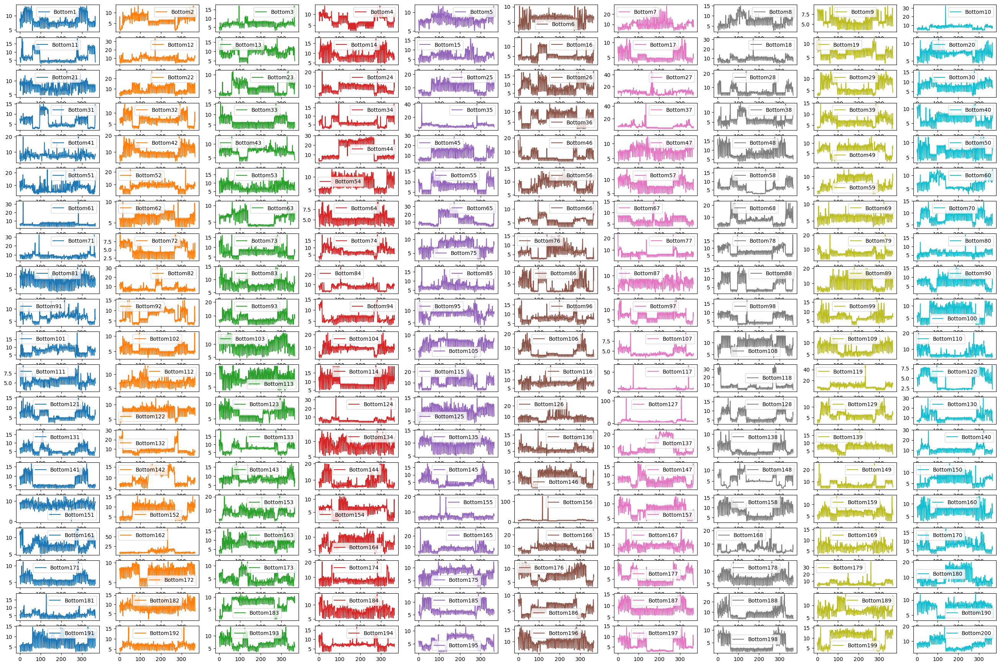

In [10]:
bottom=list(data.iloc[:,-200:].columns.values)
fig, axes = plt.subplots(nrows=20, ncols=10,figsize=(33,22))
data[data.columns.intersection(bottom)].plot(subplots=True, ax=axes)
plt.plot();

In [11]:
#  probabalistic model with likelihood function
class model(nn.Module):
    def __init__(self, num_lstms, input_dim, output_dim=1, hidden_dim=64):
        super(model, self).__init__()
        self.lstm_out = hidden_dim
        self.num_lstms = num_lstms
        lstms = []
        lstms.append(nn.LSTMCell(input_dim, self.lstm_out))
        for i in range(1, self.num_lstms):
            lstms.append(nn.LSTMCell(self.lstm_out, self.lstm_out))
        self.lstms = nn.ModuleList(lstms)
        # μ and σ  distibution -> next point for every t_i.prediction length is from output dimensions
        self.mean = nn.Linear(self.lstm_out, output_dim)
        self.std = nn.Linear(self.lstm_out, output_dim)
        
    def forward(self, input, covariates, future = 0):
        dev = input.device
        means = torch.Tensor().to(dev)
        stds = torch.Tensor().to(dev)
        outputs = []
        h_t = []
        c_t = []
        cond_ctx_len = input.size(1)
        pred_ctx_len = future
        #for covariartes concat input and covariates
        if covariates.shape[2] != 0:
            input = torch.cat((input, covariates[:, 0:cond_ctx_len, :]), 2)
        for i in range(0, self.num_lstms):
            h_t.append(torch.zeros(input.size(0), self.lstm_out, dtype=torch.float).to(dev))
            c_t.append(torch.zeros(input.size(0), self.lstm_out, dtype=torch.float).to(dev))
        '''
         h(hidden state),c(cell state)-> output of Lstm cell, h(i)-> passed to lstm(i+1) cell, 
         h(i) and c(i) are recurrent for lstm cell(i+1) 
         and the output from previous cell '''
        for i, input_t in enumerate(input.chunk(input.size(1), dim=1)):
            h_t[0], c_t[0] = self.lstms[0](input_t.squeeze(1), (h_t[0], c_t[0])) #first cell ->concat of input and covariates, recurrent input 
            for n in range(1, self.num_lstms):
                h_t[n], c_t[n] = self.lstms[n](h_t[n - 1], (h_t[n], c_t[n]))#susquent cells-> prev. output from stack, recurrent input
            mean = self.mean(h_t[n])
            std = self.std(h_t[n])
            means = torch.cat((means, mean.unsqueeze(1)), 1)
            stds = torch.cat((stds, std.unsqueeze(1)), 1)
        stds = self.softplus(stds)
       
        for i in range(future):
            output_t = torch.cat((mean, covariates[:, cond_ctx_len + i, :]), 1)
            h_t[0], c_t[0] = self.lstms[0](output_t, (h_t[0], c_t[0]))
            for n in range(1, self.num_lstms):
                h_t[n], c_t[n] = self.lstms[n](h_t[n - 1], (h_t[n], c_t[n]))
            mean = self.mean(h_t[n])
            std = self.std(h_t[n])
            std = self.softplus(std) # avoid infinties
            means = torch.cat((means, mean.unsqueeze(1)), 1)
            stds = torch.cat((stds, std.unsqueeze(1)), 1)
        means = means.unsqueeze(-1)
        stds = stds.unsqueeze(-1)
        outputs = torch.cat((means, stds), -1)
        return outputs

    def sample(self, mean, std):
        normal_dist = torch.distributions.normal.Normal(mean, std)
        return normal_dist.sample()

    def softplus(self, x):
        softplus = torch.log(1+torch.exp(x))
        softplus = torch.where(softplus==float('inf'), x, softplus)
        return softplus

    def NLL(self, outputs, truth,AG):#negative log liklihood
        hierarchy_tot,bottom_tot=AG.shape
        mean, std = torch.split(outputs, 1, dim=3)
        AG_tensor= torch.from_numpy(AG)    
        mean = mean.squeeze(3)
        std = std.squeeze(3)
        std=std**2
        #bottom value calculation
        bottom_mean= mean[:, :, -bottom_tot:]
        bottom_std=std[:, :, -bottom_tot:]
        #hierarchy value calculation
        Hierarchy_mean=torch.matmul(bottom_mean.float(),AG_tensor.T.float())
        Hierarchy_std=torch.matmul(bottom_std.float(),AG_tensor.T.float())
        #all values for loss calculation top values are hierarchy and lower values are bottom
        total_mean=torch.cat((Hierarchy_mean,bottom_mean),dim=2)
        total_std=torch.cat((Hierarchy_std,bottom_std),dim=2)**0.5
        torch.pi = torch.acos(torch.zeros(1)).item()
        loss = torch.mean((0.5*torch.log(2*torch.pi*(total_std**2)))+torch.div(torch.sub(total_mean,truth)**2, total_std**2))
        return loss
    


# using NLL
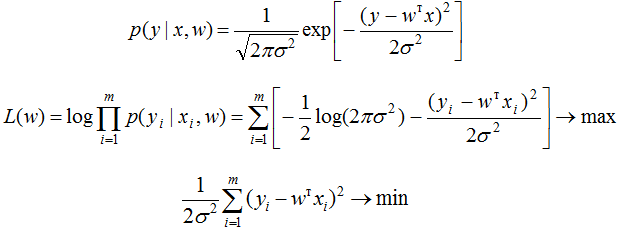!

In [12]:
def date_cv(x):
    return datetime.strptime(x, '%Y-%m-%d %H:%M:%S')

In [13]:
'''

_params_ = {'lr': 0.01,
    'lr_step_size': 1000,
    'lr_gamma': .1,
    'ctx_win_len': 22,
    'cond_win_len': 10,
    'batch_size': 512,
    'num_covariates': 0,
    'total_num_covariates': 0,
    'num_time_idx': 0,
    'num_targets': 89,
    'total_num_targets': 89,
    'num_lstms': 2,
    'hidden_dim': 64,
    'max_batches_per_epoch': 200,
    'num_epochs': 100,
    'data_file': 'trsv.csv',
    'train_test_split':0.7
}

'''

_params_ = {'lr': 0.01,
    'lr_step_size': 100,
    'lr_gamma': 1,
    'ctx_win_len':60,
    'cond_win_len':50,
    'batch_size': 512,
    'num_covariates': 0,
    'total_num_covariates': 0,
    'num_time_idx': 0,
    'num_targets': 207,
    'total_num_targets': 207,
    'num_lstms': 2,
    'hidden_dim': 64,
    'max_batches_per_epoch': 200,
    'num_epochs': 100,
    'data_file': 'trffc.csv',
    'train_test_split':0.8
}


In [14]:
class utils:
    def __init__(self, dev,_params):
        self.min = 0
        self.max = 0
        self.range = 0
        self.mean = 0
        self.dev = dev
        self._params = _params

    def split_batch(self, batch):
        num_time_idx = self._params['num_time_idx']
        num_targets = self._params['num_targets']
        total_num_targets = self._params['total_num_targets']
        num_covariates = self._params['num_covariates']    
        b = num_time_idx
        time_idx = batch[:, 1::, :b].to(self.dev).float()
        e = b + num_targets
        input = batch[:, 0:-1, b: e].to(self.dev).float()
        target = batch[:, 1::, b: e].to(self.dev).float()
        e = e - num_targets + total_num_targets
        total_num_covariates = batch.shape[2] - e + 1  
        covariates = time_idx
        b = e
        e = b + num_covariates
        if (num_covariates > 0):
            covariates = torch.cat((time_idx, batch[:, 1::, b: e]), -1)
        return input, target, covariates

    def scale(self, input, covariates):
        
        self.mean = torch.mean(input, dim=1).unsqueeze(1)
        input = input - self.mean
        min = torch.min(input, dim=1)[0].unsqueeze(1)
        max = torch.max(input, dim=1)[0].unsqueeze(1)
        self.range = max - min
        self.range[self.range < 1e-5] = 1e-5
        input = input / self.range

        num_covariates = self._params['num_covariates']
        if (num_covariates > 0):
            mean = torch.mean(covariates, dim=1).unsqueeze(1)
            covariates = covariates - mean
            min = torch.min(covariates, dim=1)[0].unsqueeze(1)
            max = torch.max(covariates, dim=1)[0].unsqueeze(1)
            range = max - min
            range[range < 1e-5] = 1e-5
            covariates = covariates / range
        return input, covariates

    def invert_scale(self, input, probabalistic=False):
        if probabalistic == False:
            return input * self.range + self.mean
        else:
            mean = input[:, :, :, 0]
            std = input[:, :, :, 1]
            scaled_mean = mean * self.range + self.mean
            scaled_std = std * torch.sqrt(self.range)
            return torch.cat((scaled_mean.unsqueeze(-1), scaled_std.unsqueeze(-1)), -1)

In [15]:
data.dtypes

Total        float64
y1           float64
y2           float64
y11          float64
y12          float64
              ...   
Bottom196    float64
Bottom197    float64
Bottom198    float64
Bottom199    float64
Bottom200    float64
Length: 207, dtype: object

In [16]:
data.to_csv('dataset/trffc.csv')

In [17]:
class MyDataset(Dataset):
    def __len__(self):
        return self.dataset_size
    def __getitem__(self, idx):
        rel_time = torch.from_numpy(np.arange(0, self.ctx_win_len) * self.resolution).unsqueeze(1).float().to(self.dev)
        abs_time = torch.from_numpy(np.arange(idx, idx + self.ctx_win_len) * self.resolution).unsqueeze(1).float().to(
            self.dev)
        if (self.num_time_indx == 2):  
            out = torch.cat((rel_time, abs_time, self.scaled[idx: idx + self.ctx_win_len, :]), -1).unsqueeze(0)
        if (self.num_time_indx == 1):  
            out = torch.cat((rel_time, self.scaled[idx: idx + self.ctx_win_len, :]), -1).unsqueeze(0)
        if (self.num_time_indx == 0):  
            out = self.scaled[idx: idx + self.ctx_win_len, :].unsqueeze(0)
        return torch.squeeze(out, 0)
    
    def get_train_test_samplers(self, train_test_split):
        indices = list(range(self.dataset_size))
        print
        split = int(np.floor(train_test_split * self.dataset_size))
        train_indices, test_indices = indices[: split - self.ctx_win_len], indices[split: -self.ctx_win_len]
        return SubsetRandomSampler(train_indices), SubsetRandomSampler(test_indices)
    def plot_corr(self, df, size=10):
        corr = df.corr()
        fig, ax = plt.subplots(figsize=(size, size))
        ax.matshow(corr)
        plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical')
        plt.yticks(range(len(corr.columns)), corr.columns)


In [18]:
class Data_pre(MyDataset):
    def __init__(self, csv_file, dev, ctx_win_len, num_time_indx=1):
        self.num_time_indx = num_time_indx
        self.dev = dev
        df = read_csv('dataset/trffc.csv',index_col=0)
        self.ctx_win_len = ctx_win_len
        values = df.values
        values = values.astype('float32')
        self.scaled = values
        self.dataset_size = self.scaled.shape[0]
        self.scaled = torch.from_numpy(self.scaled).float().to(dev)
        self.resolution = 1

In [19]:
params = _params_
dataset_ = Data_pre(csv_file=params['data_file'], dev=device, ctx_win_len=params['ctx_win_len'], num_time_indx=params['num_time_idx'])

In [20]:
num_covariates = params['num_covariates']
num_time_idx = params['num_time_idx']
num_targets = params['num_targets']
input_dim = num_time_idx + num_targets + num_covariates
ctx_win_len = params['ctx_win_len']
cond_win_len = params['cond_win_len']
pred_win_len = ctx_win_len - cond_win_len - 1
batch_size = params['batch_size']

In [21]:
model = model(num_lstms=params['num_lstms'], input_dim=input_dim, output_dim=params['num_targets'],hidden_dim=params['hidden_dim']).to(device)
optimizer = optim.Adam(model.parameters(), params['lr'])
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=params['lr_step_size'], gamma=params['lr_gamma'])

In [22]:
train_sampler, test_sampler = dataset_.get_train_test_samplers(params['train_test_split'])

In [23]:
train_dataloader = DataLoader(dataset_, batch_size=batch_size, sampler=train_sampler, shuffle=False, num_workers=0)
test_dataloader = DataLoader(dataset_, batch_size=1, sampler=test_sampler,shuffle=False, num_workers=0)
max_batches_per_epoch = params['max_batches_per_epoch']
num_epochs = params['num_epochs']

In [24]:
def test_plot(out,target,AG,epoch):
    for v in range(out.shape[0]):
        preds = out[0, :, :, :].detach().cpu().numpy()
        targets = target[0, :, :].detach().cpu().numpy()
        preds[:,0:7, 0]=preds[:,7:207, 0]@AG.T
        preds[:,0:7, 1]=((preds[:,7:207, 1])**2@AG.T)**0.5    
    for j in range(7):
        pred = preds[:, j, 0]  
        std = preds[:, j, 1]  
        targe = targets[:, j]
        plt.figure()
        plt.xlabel('x')
        plt.ylabel('y')
        plt.xticks()
        plt.yticks()
        plt.plot(np.arange(len(targe)), targe, 'r', linewidth=2.0)
        plt.plot(np.arange(cond_win_len), pred[0:cond_win_len], 'b', linewidth=2.0)
        plt.plot(np.arange(cond_win_len, cond_win_len + pred_win_len), pred[cond_win_len:], 'g' + ':',
                 linewidth=2.0)
        plt.fill_between(np.arange(len(targe)), pred - std, pred + std, color='cyan', alpha=0.5)
        plt.fill_between(np.arange(len(targe)), pred - 2 * std, pred + 2 * std, color='cyan', alpha=0.2)
        plt.title(j)
        text='figures/'+str(epoch)+str(f"{j:02d}")
        plt.savefig(text)   # save the figure to file
        plt.close()

In [25]:
def test_check(test_dataloader,model):
    test_dataloader_iter = iter(test_dataloader)
    for i in range(0, 1):
        test_batch = next(test_dataloader_iter)
        with torch.no_grad():
            model.eval()
            input, target, covariates = utils.split_batch(test_batch)
            input, covariates = utils.scale(input, covariates)
            pred = model(input[:, 0:cond_win_len, :], covariates, future=pred_win_len)
            pred = utils.invert_scale(pred, True)
            loss = model.NLL(pred, target,AG)
            print("Test loss: {0}".format(loss))
            

In [26]:
losses = []
batch_num = 1
utils = utils(device, params)
# Trainin loop
def train():
    for epoch in range(0, num_epochs):
        for i, batch in enumerate(train_dataloader):
            input, target, covariates = utils.split_batch(batch) 
            #splitting batches : issue with sequence
            #conditioning window input,Prediction window , model op conditioned on previous values
            # model output for the previous step
            input_cond = input[:, 0:cond_win_len, :]
            input_cond, covariates = utils.scale(input_cond, covariates)
            optimizer.zero_grad()
            #forward pass
            out = model(input_cond, covariates, future=pred_win_len)
            out = utils.invert_scale(out, probabalistic=True)
            #rescale
            #test_plot(out,target,AG,epoch)
            loss = model.NLL(out, target,AG)
            #loss calc
            loss.backward()
            scheduler.step()
            optimizer.step()
            loss = loss.item()
            losses.append(loss)
            print(f"epoch:{epoch} /{num_epochs}")
            print("Train loss: {0}".format(loss))
            test_check(test_dataloader,model)
            print('─' * 30)     
    return model, losses


In [27]:
model, losses = train()
data='traffic'#  dataset
date_=str(now).replace(" ", "")
model_save_ = f"{data}_epochs{params['num_epochs']}_{ date_ }"
torch.save(model.state_dict(), model_save_+".pth")

epoch:0 /100
Train loss: 3.3266663551330566
Test loss: 3.3472421169281006
──────────────────────────────
epoch:1 /100
Train loss: 3.129880428314209
Test loss: 3.0592234134674072
──────────────────────────────
epoch:2 /100
Train loss: 2.8541555404663086
Test loss: 2.7739620208740234
──────────────────────────────
epoch:3 /100
Train loss: 2.550680637359619
Test loss: 3.179767370223999
──────────────────────────────
epoch:4 /100
Train loss: 2.8145642280578613
Test loss: 3.624760389328003
──────────────────────────────
epoch:5 /100
Train loss: 3.01967191696167
Test loss: 2.6688601970672607
──────────────────────────────
epoch:6 /100
Train loss: 2.3824868202209473
Test loss: 2.4481661319732666
──────────────────────────────
epoch:7 /100
Train loss: 2.2256617546081543
Test loss: 2.4291036128997803
──────────────────────────────
epoch:8 /100
Train loss: 2.253842353820801
Test loss: 2.4864628314971924
──────────────────────────────
epoch:9 /100
Train loss: 2.281203031539917
Test loss: 2.466847

loss (prediction): 1.3753377199172974


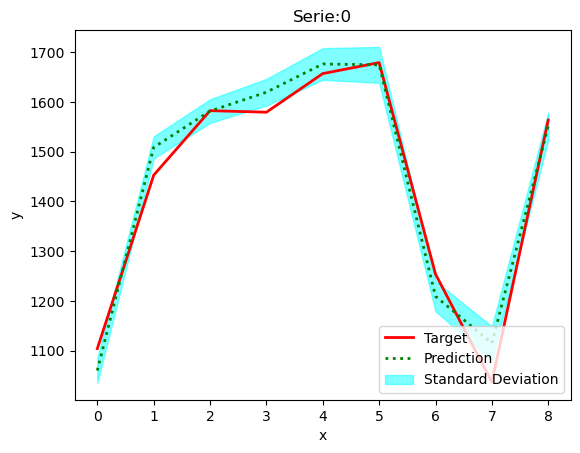

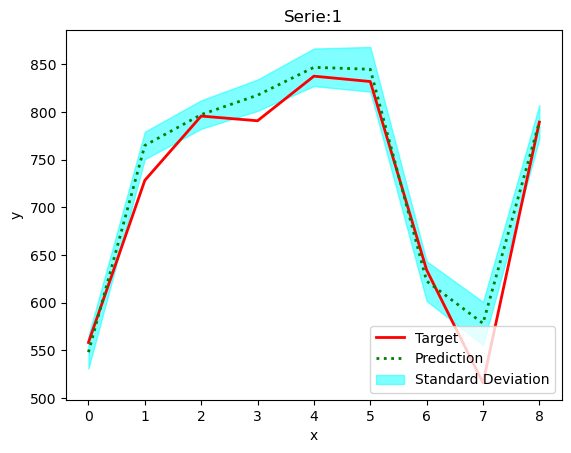

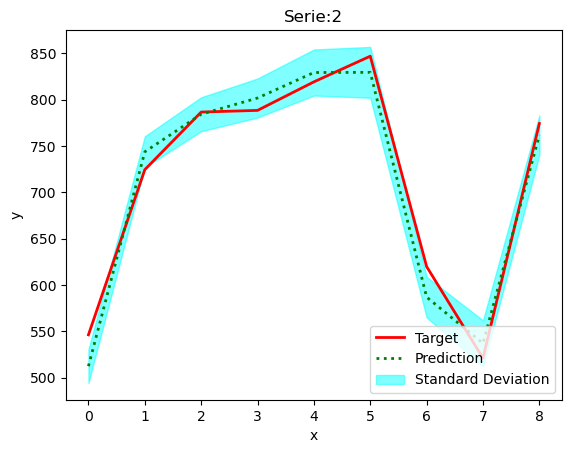

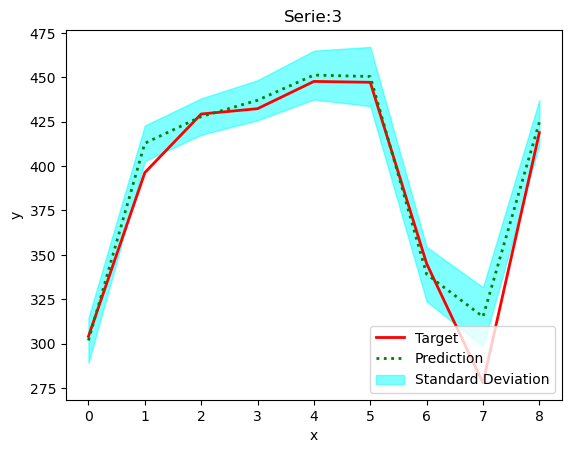

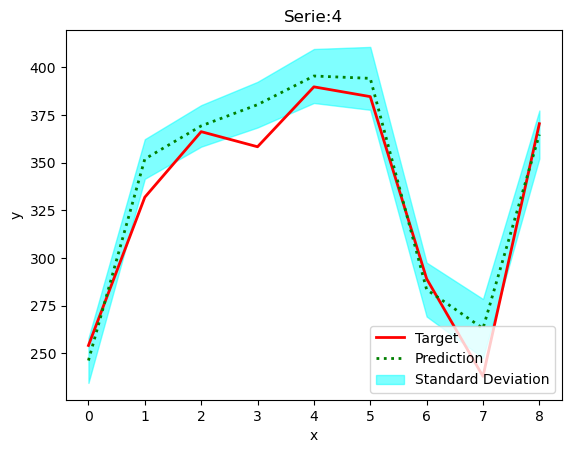

...

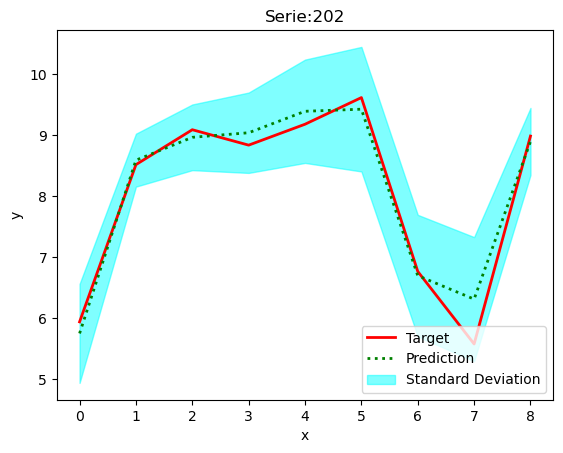

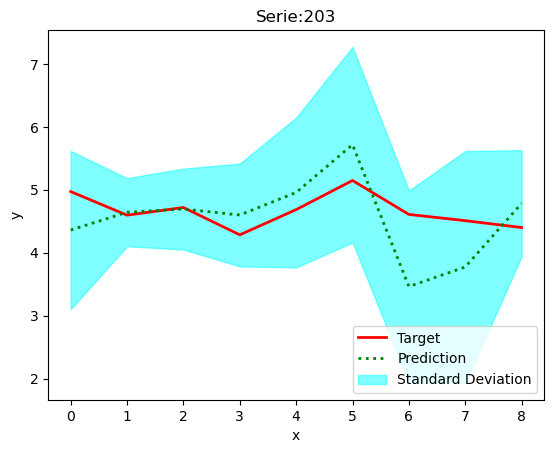

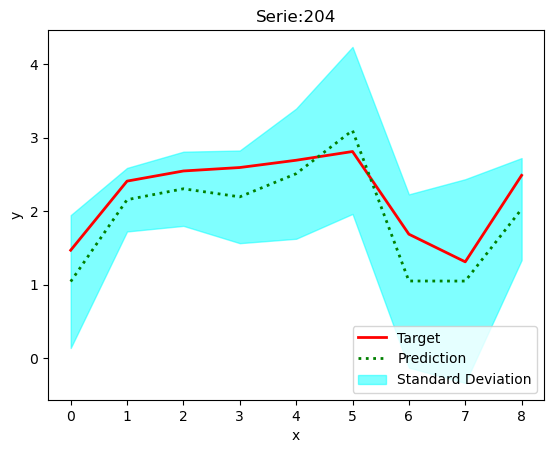

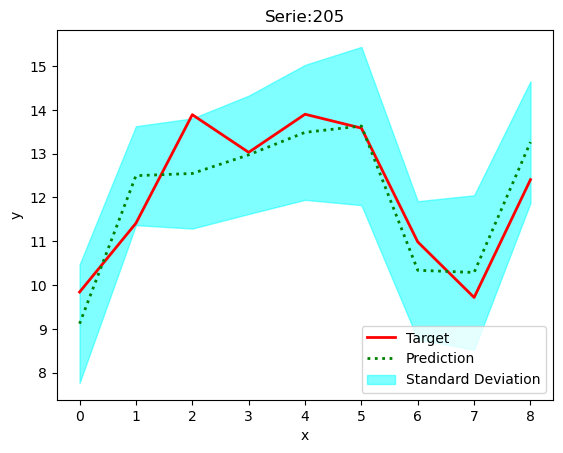

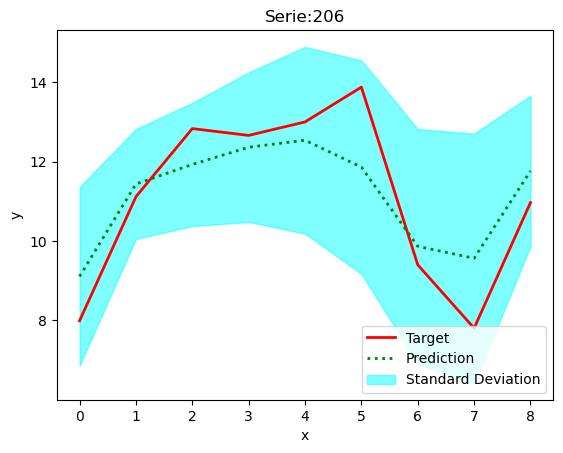

In [28]:
test_dataloader_iter = iter(test_dataloader)
loss_crps=[]
for i in range(0, 1):
    test_batch = next(test_dataloader_iter)
    with torch.no_grad():
        input, target, covariates = utils.split_batch(test_batch)
        input, covariates = utils.scale(input, covariates)
        pred = model(input[:, 0:cond_win_len, :], covariates, future=pred_win_len)
        pred = utils.invert_scale(pred, True)
        loss = model.NLL(pred, target,AG)
        print("loss (prediction): {0}".format(loss))
        preds = pred[0, :, :, :].detach().cpu().numpy()
        targets = target[0, :, :].detach().cpu().numpy()
        preds[:,0:7, 0]=preds[:,7:207, 0]@AG.T
        preds[:,0:7, 1]=((preds[:,7:207, 1])**2@AG.T)**0.5
        loss_crps.append([preds,target])
    for j in range(num_targets):
        pred = preds[:, j, 0]  
        std = preds[:, j, 1]  
        target = targets[:, j]
        plt.figure()
        plt.xlabel('x')
        plt.ylabel('y')
        plt.xticks()
        plt.yticks()
        plt.plot(np.arange(len(target[cond_win_len:])), target[cond_win_len:], 'r', linewidth=2.0,label="Target")
        #plt.plot(np.arange(cond_win_len)[cond_win_len:], pred[cond_win_len:], 'b', linewidth=2.0)
        plt.plot(np.arange(ctx_win_len-cond_win_len-1), pred[cond_win_len:], 'g' + ':',
                 linewidth=2.0,label="Prediction")
        plt.fill_between(np.arange(len(target[cond_win_len:])), pred[cond_win_len:] - std[cond_win_len:], pred[cond_win_len:] + std[cond_win_len:], color='cyan', alpha=0.5,label="Standard Deviation")
        #plt.fill_between(np.arange(len(target)), pred - 2 * std, pred + 2 * std, color='cyan', alpha=0.2)
        title='Serie:'+str(j)
        plt.title(title)
        plt.legend(loc="lower right")

In [29]:
import properscoring as ps
predictions,truths=loss_crps[0]
pred_mean,pred_std=predictions[:, :, 0],predictions[:, :, 1]
#crps for all predicted steps
k=ps.crps_gaussian(truths[0][pred_win_len:], mu=pred_mean[pred_win_len:], sig=pred_std[pred_win_len:])
#average crps along all predicted steps
np.mean(k)

0.869498943

In [31]:
values=[truths[0][pred_win_len:],pred_mean[pred_win_len:],pred_std[pred_win_len:]]

In [32]:
import pickle
with open('values.pkl', 'wb') as f:
      pickle.dump(values, f)